In [1]:
from matplotlib import pyplot as plt
import os
import pandas as pd
import numpy as np
import math
from sklearn.feature_extraction.text import CountVectorizer

In [2]:
char_data = pd.read_csv('../data/character_table_18c19c.tsv', sep = '\t')
male_data = char_data[char_data.gender == "m"]["words"]
female_data = char_data[char_data.gender == "f"]["words"]
print(female_data.head(10))
char_data.head(10)

0     was knew rang said possessed went read smiled ...
3     says pay love go described said invitation car...
6     tried remonstrated was managed possessed excit...
7     took said stamped said guess confessed refused...
11    says saying contradicted hint manner action wi...
13    reared loved considered reigned found found ha...
15    shrugging look looked inquired said shoulders ...
16    is sing began sings fancies used is congratula...
17    collected realised belong had regarded was wri...
18    take makes prune sacrifice agreed told untied ...
Name: words, dtype: object


,docid,charname,charid,gender,pubdate,words
0,0,Betsey,0|Betsey,f,1891,was knew rang said possessed went read smiled ...
1,0,Bill,0|Bill,m,1891,said was-find was-addressing said-moment said-...
2,0,Phil,0|Phil,m,1891,alighted cross halted struck accomplished let ...
3,0,Elizabeth,0|Elizabeth,f,1891,says pay love go described said invitation car...
4,0,Mr.Jones,0|Mr.Jones,m,1891,came possessed proved admired bestowed noted w...
5,0,Mr.Mitford,0|Mr.Mitford,m,1891,was did lived considered received sister heart...
6,0,Mrs.Mitford,0|Mrs.Mitford,f,1891,tried remonstrated was managed possessed excit...
7,0,Patricia,0|Patricia,f,1891,took said stamped said guess confessed refused...
8,0,Henry,0|Henry,m,1891,going was said regrets understand wife attachm...
9,0,Bertie,0|Bertie,m,1891,come said called done began delivering leaning...


In [46]:
vectorizer = CountVectorizer(max_features = 4000)
sparse_wordcounts = vectorizer.fit_transform(char_data["words"])
wordcounts = sparse_wordcounts.toarray()
charwords = pd.DataFrame(wordcounts, columns = vectorizer.get_feature_names())

m    297079
f    149380
Name: gender, dtype: int64


<AxesSubplot:title={'center':'Gender proportions'}>

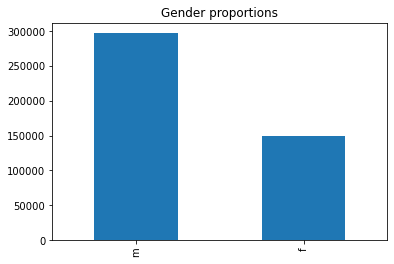

In [47]:
male_words = charwords.loc[char_data.gender == 'm', :].sum(axis = 'rows')
female_words = charwords.loc[char_data.gender == 'f', :].sum(axis = 'rows')
char_data = char_data.loc[char_data['gender'] != 'u', : ]
print(char_data['gender'].value_counts())
char_data['gender'].value_counts().plot(kind='bar', title='Gender proportions')

In [48]:
def get_dunnings(word, series1, series2):
    observed = pd.DataFrame({'series1': [series1[word], sum(series1) - series1[word]],
                          'series2': [series2[word], sum(series2) - series2[word]]},
                        index = ['word', 'all_others'])
    total_words = observed.to_numpy().sum()
    observed['word_totals'] = observed.sum(axis = 1)
    observed = observed.append(observed.sum(axis = 0).rename(index = 'group_totals'))
    observed.iat[2,2] = 0
    observed['word_totals'] = observed['word_totals'] / sum(observed['word_totals'])
    observed.loc['group_totals', : ] = observed.loc['group_totals', : ] / sum(observed.loc['group_totals', : ])
    expected = np.outer(observed['word_totals'][0:2], observed.loc['group_totals', : ][0:2])
    expected = pd.DataFrame(expected, index = ['word', 'all_others'], columns = ['series1', 'series2'])
    expected = expected * total_words
    
    G = 0
    for i in range(2):
        for j in range(2):
            O = observed.iat[i, j] + .000001
            E = expected.iat[i, j] + .000001
            G = G + O * math.log(O / E)
    
    if (observed.iat[0, 0] / sum(observed.iloc[0: 2, 0])) < (observed.iat[0, 1] / sum(observed.iloc[0 : 2, 1])):
        G = -G    # we provide a signed version of the statistic to distinguish
                  # overrepresentation in the two categories
    
    return 2 * G

In [49]:
dunningslist = []

for w in vectorizer.get_feature_names():
    G = get_dunnings(w, female_words,male_words)
    dunningslist.append(G)

dunnings = pd.Series(dunningslist, index = vectorizer.get_feature_names())
dunnings = dunnings.sort_values()

In [50]:
dunnings[0:50]

said         -84142.681610
wife         -49936.117966
man          -41109.944019
sir          -17317.437218
horse        -16456.924803
master       -15004.570134
fellow       -14773.149944
lordship     -14632.876942
men          -11266.606758
sword        -10768.659714
coat          -9410.988975
pipe          -6926.977716
hat           -6415.811184
shouted       -6391.467921
pocket        -6280.324338
legs          -5795.270710
office        -5603.534928
pockets       -5201.742664
gun           -4816.515437
king          -4790.519610
business      -4782.204669
muttered      -4708.631147
comrades      -4253.624356
rode          -4218.737992
fellows       -3912.222505
shot          -3868.419841
rifle         -3819.379480
thou          -3608.091711
cigar         -3592.418733
army          -3213.947468
comrade       -3177.577410
followers     -3164.574449
ship          -2958.390104
boat          -2923.953778
devil         -2920.884474
enemy         -2789.627373
honour        -2729.177258
l

In [51]:
dunnings[3950:]

beautiful      4584.403314
home           4632.444845
shawl          4739.407721
wept           4750.542181
sex            4770.942280
apron          4812.803745
gown           4813.428805
sobbed         4869.536133
blushed        5058.690333
children       5150.323762
hands          5339.863227
sat            5624.585782
loved          5758.433772
kissed         5765.540722
now            5808.376537
lady           5931.809077
happy          6655.760875
there          6814.262789
felt           6853.010680
love           7847.002669
mistress       8897.827640
bonnet         9359.021657
papa          10750.842349
girl          11369.982363
miss          11382.433867
cheek         11394.439098
lap           11757.479809
hair          11781.549004
tears         11863.831533
sister        12693.142471
maid          12812.160395
beauty        12878.075797
room          12915.616975
face          14046.691956
mrs           14845.037753
mamma         15284.010494
cheeks        15998.984874
o

In [52]:
!pip install wordcloud

You should consider upgrading via the '/Users/shreyailango/opt/anaconda3/bin/python -m pip install --upgrade pip' command.


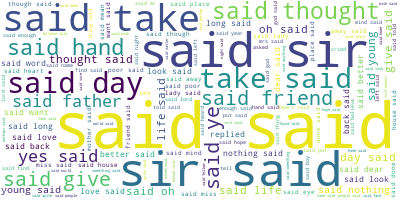

In [53]:
# Import the wordcloud library
from wordcloud import WordCloud
# Join the different processed titles together.
long_string = ','.join(list(male_data.values))
# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=1000, contour_width=3, contour_color='steelblue')
# Generate a word cloud
wordcloud.generate(long_string)
# Visualize the word cloud
wordcloud.to_image()

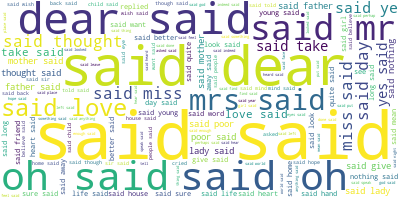

In [54]:
# Join the different processed titles together.
long_string = ','.join(list(female_data.values))
# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=1000, contour_width=3, contour_color='steelblue')
# Generate a word cloud
wordcloud.generate(long_string)
# Visualize the word cloud
wordcloud.to_image()

In [3]:
from sklearn.decomposition import LatentDirichletAllocation
import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
import seaborn as sns
import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [4]:
!pip install pyLDAvis

You should consider upgrading via the '/Users/shreyailango/opt/anaconda3/bin/python -m pip install --upgrade pip' command.


In [8]:
m_vectorizer = CountVectorizer(max_features = 2000)
m_sparse_wordcounts = m_vectorizer.fit_transform(male_data)

In [9]:
lda = LatentDirichletAllocation(n_components=200, random_state=0, max_iter = 2)
lda.fit(m_sparse_wordcounts)

LatentDirichletAllocation(max_iter=2, n_components=200, random_state=0)

In [10]:
lda.perplexity(m_sparse_wordcounts)

92.45269343981226

In [11]:
pyLDAvis.sklearn.prepare(lda, m_sparse_wordcounts, m_vectorizer)

/Users/shreyailango/opt/anaconda3/lib/python3.8/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
18     0.273330 -0.010302       1        1  49.598049
147    0.208765 -0.011358       2        1  10.066967
65     0.161582  0.004135       3        1   8.392346
58     0.219847  0.002395       4        1   4.446257
62     0.127221 -0.004899       5        1   3.143904
...         ...       ...     ...      ...        ...
22    -0.055370  0.005019     196        1   0.016131
12     0.036640  0.000909     197        1   0.015140
40    -0.008607 -0.013789     198        1   0.014302
1     -0.014398 -0.008769     199        1   0.011208
118    0.038975 -0.001008     200        1   0.007603

[200 rows x 5 columns], topic_info=         Term          Freq         Total  Category  logprob  loglift
1522     said  2.960052e+07  2.960052e+07   Default  30.0000  30.0000
1908      was  4.022903e+06  4.022903e+06   Default  29.0000  29.0000
821       had  4.688610e+05  4.688610e+05   Default  28.0000  28.0000
1940     wife  2.265120e+05  2.265120e+05   Default  27.0000  27.0000
623      eyes  2.498610e+05  2.498610e+05   Default  26.0000  26.0000
...       ...           ...           ...       ...      ...      ...
647    father  2.489570e+01  2.304832e+05  Topic200  -5.4089   0.3511
1825     took  2.342541e+01  2.058641e+05  Topic200  -5.4698   0.4032
115     asked  2.243859e+01  2.356476e+05  Topic200  -5.5128   0.2251
1801  thought  2.194160e+01  2.298834e+05  Topic200  -5.5352   0.2274
853     heard  2.013696e+01  1.474228e+05  Topic200  -5.6211   0.5859

[12168 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
0         1  0.406536  abandoned
0         2  0.113419  abandoned
0         3  0.039687  abandoned
0         4  0.020145  abandoned
0         5  0.035053  abandoned
...     ...       ...        ...
1999    196  0.000298      youth
1999    197  0.000298      youth
1999    198  0.000198      youth
1999    199  0.000248      youth
1999    200  0.000050      youth

[216730 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[19, 148, 66, 59, 63, 98, 27, 48, 146, 179, 64, 199, 173, 12, 197, 6, 31, 191, 115, 103, 116, 114, 15, 200, 73, 72, 71, 196, 135, 38, 125, 54, 80, 7, 24, 30, 89, 20, 70, 93, 75, 62, 52, 174, 144, 192, 77, 95, 79, 128, 88, 28, 165, 22, 5, 3, 126, 169, 40, 123, 156, 151, 122, 67, 194, 90, 158, 113, 84, 189, 163, 29, 159, 21, 138, 92, 106, 145, 111, 172, 171, 105, 60, 162, 157, 183, 181, 46, 107, 1, 176, 133, 42, 36, 131, 96, 101, 86, 32, 139, 10, 69, 112, 74, 35, 155, 104, 51, 65, 166, 178, 164, 45, 190, 91, 97, 124, 9, 129, 16, 85, 109, 4, 149, 132, 18, 47, 136, 150, 94, 53, 120, 56, 160, 180, 68, 185, 187, 44, 143, 76, 49, 81, 121, 50, 102, 147, 8, 33, 137, 188, 78, 43, 55, 154, 58, 140, 198, 195, 134, 170, 83, 153, 117, 87, 11, 168, 110, 39, 182, 82, 108, 177, 118, 100, 152, 17, 186, 34, 61, 25, 99, 175, 37, 127, 193, 161, 167, 14, 26, 184, 57, 142, 141, 130, 23, 13, 41, 2, 119])

In [12]:
f_vectorizer = CountVectorizer(max_features = 2000)
f_sparse_wordcounts = f_vectorizer.fit_transform(female_data)

In [13]:
lda = LatentDirichletAllocation(n_components=200, random_state=0, max_iter = 2)
lda.fit(f_sparse_wordcounts)

LatentDirichletAllocation(max_iter=2, n_components=200, random_state=0)

In [15]:
lda.perplexity(f_sparse_wordcounts)

109.48142410198767

In [16]:
pyLDAvis.sklearn.prepare(lda, f_sparse_wordcounts, f_vectorizer)

/Users/shreyailango/opt/anaconda3/lib/python3.8/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
172   -0.273346 -0.018720       1        1  28.945927
56    -0.255184 -0.023271       2        1  15.006759
90    -0.164949 -0.041660       3        1   8.600042
186   -0.192096 -0.017514       4        1   7.171749
2     -0.197190 -0.028618       5        1   4.395881
...         ...       ...     ...      ...        ...
99    -0.005988 -0.035312     196        1   0.015430
106    0.027180 -0.005750     197        1   0.014722
129    0.032913 -0.002397     198        1   0.014547
160   -0.014563 -0.023138     199        1   0.013929
150   -0.020696 -0.002862     200        1   0.011806

[200 rows x 5 columns], topic_info=        Term          Freq         Total  Category  logprob  loglift
1513    said  1.703996e+07  1.703996e+07   Default  30.0000  30.0000
1906     was  2.442020e+06  2.442020e+06   Default  29.0000  29.0000
834      had  2.948080e+05  2.948080e+05   Default  28.0000  28.0000
664   father  2.207000e+05  2.207000e+05   Default  27.0000  27.0000
640     eyes  2.489250e+05  2.489250e+05   Default  26.0000  26.0000
...      ...           ...           ...       ...      ...      ...
1523     saw  2.381372e+01  1.068121e+05  Topic200  -5.4065   0.6358
841    hands  2.358623e+01  9.845499e+04  Topic200  -5.4161   0.7076
273     came  2.307355e+01  9.146943e+04  Topic200  -5.4381   0.7593
641     face  2.378184e+01  1.865843e+05  Topic200  -5.4079   0.0766
838     hand  2.342873e+01  1.762716e+05  Topic200  -5.4228   0.1185

[12158 rows x 6 columns], token_table=      Topic      Freq   Term
term                        
0         1  0.249952   able
0         2  0.102950   able
0         3  0.076076   able
0         4  0.083067   able
0         5  0.037361   able
...     ...       ...    ...
1999    195  0.000499  youth
1999    196  0.000083  youth
1999    197  0.000083  youth
1999    199  0.000166  youth
1999    200  0.000166  youth

[185997 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[173, 57, 91, 187, 3, 146, 5, 174, 93, 43, 110, 177, 18, 97, 150, 149, 122, 117, 128, 196, 19, 22, 120, 11, 86, 166, 115, 48, 83, 127, 50, 6, 70, 33, 58, 197, 7, 121, 20, 88, 159, 49, 66, 133, 81, 61, 169, 28, 145, 104, 67, 123, 68, 192, 71, 26, 139, 64, 181, 62, 112, 136, 111, 142, 60, 87, 156, 14, 77, 55, 193, 153, 106, 185, 164, 200, 165, 79, 186, 190, 96, 183, 101, 178, 191, 31, 98, 46, 126, 134, 38, 76, 21, 52, 30, 75, 179, 132, 129, 78, 154, 69, 94, 1, 105, 103, 157, 54, 137, 92, 42, 10, 85, 131, 194, 148, 23, 116, 167, 17, 82, 39, 163, 180, 188, 109, 13, 25, 74, 175, 141, 47, 9, 36, 108, 80, 34, 95, 15, 125, 182, 176, 114, 170, 73, 12, 118, 89, 124, 168, 8, 158, 143, 4, 29, 16, 41, 189, 144, 56, 184, 2, 35, 119, 27, 99, 199, 102, 135, 160, 172, 90, 63, 162, 45, 113, 44, 51, 140, 171, 72, 59, 138, 32, 40, 53, 195, 65, 24, 198, 37, 155, 84, 147, 152, 100, 107, 130, 161, 151])